# Рынок заведений общественного питания Москвы

  Инвесторы из фонда «Shut Up and Take My Money» просят  подготовить исследование рынка заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего  места для открытия нового заведения кафе, ресторана, пиццерии, паба или бара, определиться с меню и ценами.

 Для исследования мы имеем датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

 Описание данных:

Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона.
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

План проекта:

1. Загрузить и изучить имеющуюся информацию.
2. Обработать данные для анализа.
3. Проанализировать данные, построить визуализации.
4. Проверить, осуществлима ли мечта заказчиков открыть кофейню.
5. Создать понятную для заказчика презентацию.

## Загрузка и изучение данных.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import warnings
warnings.filterwarnings("ignore")

In [ ]:
try:
  # смотрим есть ли локально файл
  data = pd.read_csv('/datasets/moscow_places.csv', sep=',')
except:
  # если же его нет
  data = pd.read_csv('/datasets/moscow_places.csv', sep=',')

In [ ]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [ ]:
# приведем столбцы к нижнему регистру
data['name'] = data['name'].str.lower()
data['address'] =data['address'].str.lower()

***Вывод:***

Данные загрузили. Всего 14 столбцов и 8406 строк. Названия столбцов привели к нижнему регистру, типы данных все подходят. На первый взгляд в данных много пропусков. Возможно есть дубликаты. Проверим это на следующем шаге.

##  Предобработка данных.

In [ ]:
# проверим пропуски
data.isna().sum().sort_values(ascending=False)

middle_coffee_cup    7867
middle_avg_bill      5253
price                5087
avg_bill             4586
seats                3610
hours                 535
is_24_7                 0
street                  0
chain                   0
name                    0
category                0
rating                  0
lng                     0
lat                     0
district                0
address                 0
type_rating             0
dtype: int64

In [ ]:
# посмотрим явные дубликаты
data.duplicated().sum()

0

In [ ]:
#посмотрим неявные дубликаты. Только по названию проверить не корректно, проверим по названию и адресу.
data.duplicated(subset=['name', 'address']).sum()

4

In [ ]:
# удалим неявные дубликаты
data = data.drop_duplicates(subset=['name', 'address'])

Создадим столбец street с названиями улиц из столбца с адресом. Назания улиц находятся после запятой, поэтому используем метод split

In [ ]:
data['street'] = data['address'].str.split(',').str[1]

Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [ ]:
data['is_24_7'] = data['hours'] == 'ежедневно, круглосуточно'

***Вывод:*** Пропуски в полях часы работы, количество посадочных мест. Самое большое количество пропусков в полях с ценами: price, avg_bill,middle_avg_bill, middle_coffe_cup. Это ожидаемо т.к. данные заполняли пользователи, поэтому заполнено к сожалению не все. Мы с этим ничего сделать не сможем, оставим пропуски пока как есть. Явных дубликатов в данных нет. Не явных по имени и адресу нашли 4, их удалили. Дополнительно создали столбец street с названиями улиц из столбца с адресом и столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7).
Данные готовы к анализу.

##  Анализ данных.

### Посмотрим какие категории заведений представлены в данных. Исследем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации распределение заведений по категориям.

In [ ]:
# посмотрим какие категории представлены в данных и количество их по категориям
data['category'].value_counts()

кафе               2376
ресторан           2042
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

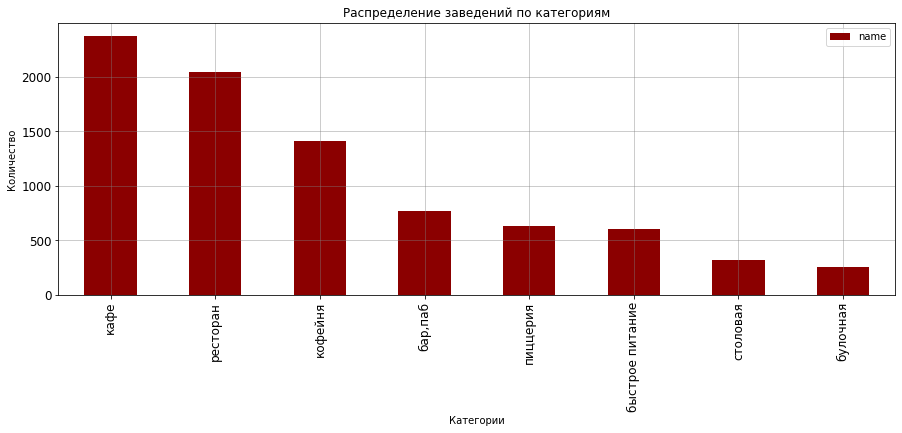

In [ ]:
# Построим визуализации распределение заведений по категориям
category_count = data.pivot_table(index = 'category', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False)
category_count.plot(kind = 'bar', color='darkred', figsize=(15, 5), fontsize=12)
plt.title('Распределение заведений по категориям')
plt.ylabel('Количество')
plt.xlabel('Категории')
plt.grid(color='grey', axis='both', alpha=0.5)
plt.show()

***Вывод:*** По таблице и визуализации видим что в имеющихся данных по количеству заведений на первом месте находятся Кафе, чуть меньше Ресторанов, на третьем месте Кофейни. На последих местах с ббольшой разницей столовые и булочные.

### Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации и проанализируеме результаты.

In [ ]:
# посмотрим общее количество посадочных мест по категориям
data_seats = data.pivot_table(index = 'category', values = 'seats', aggfunc = 'sum').sort_values(by = 'seats', ascending = False)
print('Общее количество посадочных мест:', data_seats)
# посмотрим среднее количество посадочных мест по категориям
data_seats = data.pivot_table(index = 'category', values = 'seats', aggfunc = 'median').sort_values(by = 'seats', ascending = False)
print('Среднее количество посадочных мест:', data_seats)

Общее количество посадочных мест:                     seats
category                 
ресторан         154681.0
кафе             118494.0
кофейня           83511.0
бар,паб           58131.0
пиццерия          40350.0
быстрое питание   34513.0
столовая          16359.0
булочная          13229.0
Среднее количество посадочных мест:                  seats
category              
ресторан          86.0
бар,паб           82.0
кофейня           80.0
столовая          75.5
быстрое питание   65.0
кафе              60.0
пиццерия          55.0
булочная          50.0


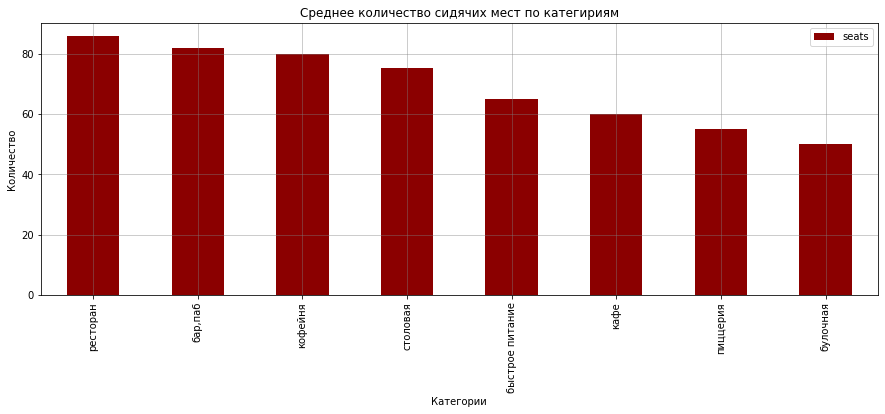

In [ ]:
# построим визуализации для посадочных мест по категориям
data_seats.plot(kind = 'bar', color='darkred', figsize=(15, 5))
plt.title('Среднее количество сидячих мест по категириям')
plt.ylabel('Количество')
plt.xlabel('Категории')
plt.grid(color='grey', axis='both', alpha=0.5)
plt.show()

***Вывод:*** В имеющемся датафрейме половина данных по количеству сидячих мест отсутствует (из 8406 заполнено только 4795 строк). По имеющимся даным можем судить, что самое большое количество сидячих мест в ресторанах, на втором месте  барыы, на третьем кофейни. Меньше всего в пиццериях и булочных.    

### Рассмотрим и изобразим соотношение сетевых и не сетевых заведений общественного питания  в датасете.

In [ ]:
chain = data.pivot_table(index = 'chain', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
chain

,chain,name
0,0,5199
1,1,3203


In [ ]:
chain.columns = ['chain', 'count']
fig = go.Figure(data=[go.Pie(labels=chain['chain'], values=chain['count'], hole=0.7)])
fig.update_layout(
    title="Соотношение сетевых и несетевых заведений",
    title_x = 0.7,
    margin=dict(l=0, r=0, t=30, b=0),
    annotations=[dict(text='0 - не сетевые<br>1- сетевые<br>', x=0.5, y=0.5, font_size=40, showarrow=False)])
fig.show()

***Вывод:*** Как видим из визуализации доля не сетевых заведений значительно превышает долю сетевых.

### Выясним какие категории заведений чаще являются сетевыми. Построим график.

In [ ]:
# используя запрос отфильтруем только сетевые заведения поле chain = 1
data_chain1 = data.query('chain == 1').pivot_table(index = 'category', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False)
data_chain1_mr = category_count.merge(data_chain1, how='left', on='category').reset_index()
data_chain1_mr.columns = ['category', 'count', 'chain_1']
# добавим еще одно поле процент от всех сетевых заведений
data_chain1_mr['pr'] = round(data_chain1_mr['chain_1']/data_chain1_mr['count']*100, 1)
data_chain1_mr = data_chain1_mr.sort_values(by = 'pr', ascending = False)
data_chain1_mr

,category,count,chain_1,pr
7,булочная,256,157,61.3
4,пиццерия,633,330,52.1
2,кофейня,1413,720,51.0
5,быстрое питание,603,232,38.5
1,ресторан,2042,729,35.7
0,кафе,2376,779,32.8
6,столовая,315,88,27.9
3,"бар,паб",764,168,22.0


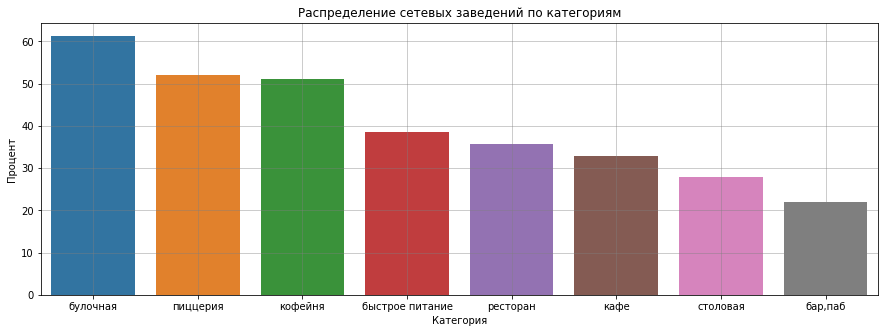

In [ ]:
# построим диаграмму, которая отобразит распределение сетевых заведений по категориям
plt.figure(figsize=(15, 5))
sns.barplot(data=data_chain1_mr, x='category', y='pr')
plt.title('Распределение сетевых заведений по категориям')
plt.ylabel('Процент')
plt.xlabel('Категория')
plt.grid(color='grey', axis='both', alpha=0.5)
plt.show()

***Вывод:*** По графику видим, что сетевыми чаще всего бывают булочные, пиццерии и кофейни. Реже всего бары и столовые.

### Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Построим  визуализацию.

In [ ]:
# используя запрос отфильтруем 15 популярных сетевых заведений chain = 1
top_15 = data.query('chain == 1').pivot_table(index = 'name', values = 'chain', aggfunc = 'count').sort_values(by = 'chain', ascending = False).reset_index().head(15)
top_15


,name,chain
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


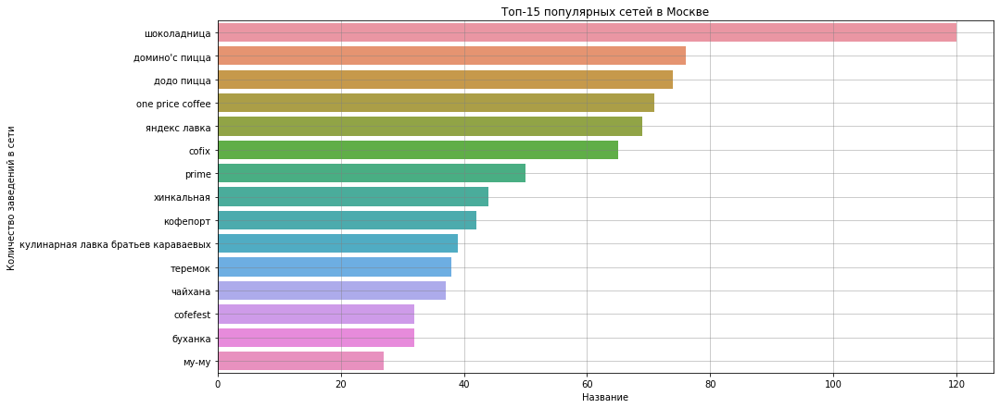

In [ ]:
# построим диаграмму, которая отобразит топ 15 популярных сетей
plt.figure(figsize=(15, 7))
sns.barplot(data=top_15, x='chain', y='name')
plt.title('Топ-15 популярных сетей в Москве')
plt.ylabel('Количество заведений в сети')
plt.xlabel('Название')
plt.grid(color='grey', axis='both', alpha=0.5)
plt.show()

Посчитаем, скольо всего заведений вошли  в топ 15

In [ ]:
print('В топ-15 входит:', top_15['chain'].sum(), 'заведений')

В топ-15 входит: 816 заведений


Посмотрим к какой категории заведений  относятся топ 15 сетевых заведений.

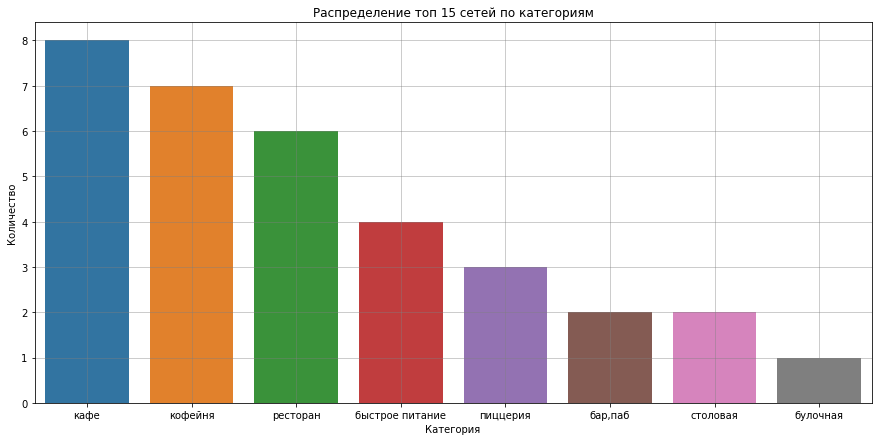

In [ ]:
# создадим переменную с названием заведений из топ 15
top_15_name = top_15['name']
top_15_cat = data.query('name in @top_15_name').pivot_table(index = 'category', values = 'name', aggfunc = 'nunique').reset_index().sort_values(by = 'name', ascending = False)
plt.figure(figsize=(15, 7))
sns.barplot(data=top_15_cat, x='category', y='name')
plt.title('Распределение топ 15 сетей по категориям')
plt.ylabel('Количество')
plt.xlabel('Категория')
plt.grid(color='grey', axis='both', alpha=0.5)
plt.show()

***Вывод:*** Сгруппировав данные по названиям заведений и определив топ-15 популярных сетей в Москве, видим, что больше всего  сетевых заведений с названием Шоколадница. Шоколадница лидирует с большим отрывом. На втором месте доминос с пицца и на третьем додо пицца. Все следующие заведения идут не с таким уже большим отрывом.
Если посмотреть топ 15 популярных сетей с распределением по категориям, то видим, что большинство из них относятся к категории кафе, кофейни и рестораны. Всего в топ 15 вошли 816 заведений.

### Посмотрим какие административные районы Москвы присутствуют в датасете. Отобразим общее количество заведений и количество заведений каждой категории по районам. Построим визуализацию.

Посмотрим какие административные районы Москвы присутствуют в датасете

In [ ]:
data['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             898
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

Всего 9 административных районов. Больше всего заведений 2242 в центральном районе. Меньше всего в Северо-Западном 409. По остальным районам заведения распределены примерно одинаково.

Создадим датасет по административным районам Москвы с разбивкой по категориям

In [ ]:
district_category = data.groupby(['district', 'category']).agg(count=('category', 'count')).reset_index().sort_values(by = 'count', ascending = False)
district_category

,district,category,count
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
...,...,...,...
32,Северо-Западный административный округ,"бар,паб",23
39,Северо-Западный административный округ,столовая,18
63,Юго-Западный административный округ,столовая,17
49,Юго-Восточный административный округ,булочная,13


Таблица здесь совсем не нагляда, построим визуализацию.

In [ ]:
fig = px.bar(district_category, x='district', y='count',color='category')
fig.update_layout(title='Общее количество заведений и количество каждой категории по районам',
                   xaxis_title='Количество',
                   yaxis_title='Район',
                   width=900,
                   height=700)
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.update_yaxes(range=[0, 2500], row=1, col=1)
fig.show()

***Вывод:*** Всего в датасете присутствуют 9 административных районов. Больше всего заведений 2242 в центральном районе. Из них больше всего ресторанов , кафе, кофейни и бары.  Меньше всего заведний в Северо-Западном административном округе - 409. По остальным районам заведения распределены примерно одинаково. Везде лидируют кафе, на втором месте рестораны, на третьем кофейни. И нигде нет такого процента баров как в центральном районе.

### Визуализируем распределение средних рейтингов по категориям заведений.

In [ ]:
data_rating = data.pivot_table(index = 'category', values = 'rating', aggfunc = 'mean').round(2).sort_values('rating', ascending=False).reset_index()
data_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


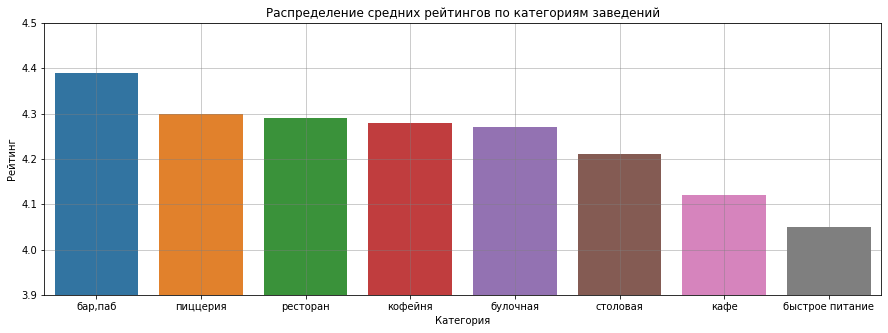

In [ ]:
plt.figure(figsize=(15, 5))
sns.barplot(data=data_rating, x='category', y='rating')
plt.title('Распределение средних рейтингов по категориям заведений')
plt.ylabel('Рейтинг')
plt.xlabel('Категория')
plt.grid(color='grey', axis='both', alpha=0.5)
plt.ylim(3.9, 4.5)
plt.show()

***Вывод:*** На графике видим, что усреднённые рейтинги в разных типах общепита отличаются не сильно и расположены от 4 до 4.5.  Ниже всего рейтинг у категории быстрое питание, чуть выше у кафе. Самый высокий у баров.

### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [ ]:
district_rating = data.pivot_table(index = 'district', values = 'rating', aggfunc = 'mean').round(2).sort_values('rating', ascending=False).reset_index()
district_rating

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Западный административный округ,4.18
4,Южный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [ ]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# Создаем карту Мск
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.6,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# вывод карты
m

***Вывод:*** Здесь видим, что самый высокий рейтин посетители ставят заведения в Центральном административном округе, далее в Северном и Северо-Западном. В Северо-Западном заведений меньше всего, но кормят видимо вкусно. А вот в Юго восточном округе рейтинг заведений самый низкий.

### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [ ]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
# функция, принимающая строку датафрейма, создает маркер в текущей точке и
# добавляет его в кластер marker_cluster
def create_cluster(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
# к каждой строке датафрейма применяем функцию
data.apply(create_cluster, axis=1)

m

***Вывод:*** Подтвердились данные из предыдущих пунктов, что больше всего заведений в Центральном округе.

### Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

In [ ]:
# найдем 15 популярных улиц по количеству заведений заведений
street_15 = data.pivot_table(index = 'street', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index().head(15)
street_15

,street,name
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


На первом месте в рейтинге топ 15 улиц по количеству заведений Проспект мира (Северо-Восточного административный округ и Центральный административный округ), далее Профсоюзая улица (ЮЗАО) и Проспект Вернадского (Западный административный округ). Улицы лидеры находятся даже не в Центральном округе!

In [ ]:
# cоздадим переменную с названиями улиц из топ 15
street_15_name = street_15['street']
street_15_name

0               проспект мира
1           профсоюзная улица
2        проспект вернадского
3          ленинский проспект
4      ленинградский проспект
5           дмитровское шоссе
6             каширское шоссе
7            варшавское шоссе
8         ленинградское шоссе
9                        мкад
10           люблинская улица
11             улица вавилова
12       кутузовский проспект
13       улица миклухо-маклая
14            пятницкая улица
Name: street, dtype: object

In [ ]:
street_category = data.query('street in @street_15_name').groupby(['street', 'category']).agg(count=('category', 'count')).sort_values(by = 'count', ascending = False).reset_index()
street_category

,street,category,count
0,проспект мира,кафе,53
1,мкад,кафе,45
2,проспект мира,ресторан,45
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35
...,...,...,...
106,люблинская улица,пиццерия,1
107,проспект вернадского,булочная,1
108,мкад,столовая,1
109,кутузовский проспект,булочная,1


Создадим датасет по топ 15 улиц с разбивкой по категориям

In [ ]:
fig = px.bar(street_category, x='street', y='count',color='category')
fig.update_layout(title='Распределение количества заведений и их категорий по топ 15 улиц',
                   xaxis_title='Улица',
                   yaxis_title='Количество',
                  # yaxis={'categoryorder':'total ascending'},
                   width=900,
                   height=700)
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

***Вывод:*** По графику подтверржаем, что улица лидер - Проспект мира. Больше всего на ней ресторанов, кафе и кофейн. За ней следует Профсоюзная улица, на которой лидирут кафе, рестораны, и примерно одинаковое количество пиццерий, кофейн и заведений быстрого питания. Меньше всего на всех улицах из топ 15 столовых и булочных.

### Найдем улицы, на которых находится только один объект общепита.

In [ ]:
street_one = data['street'].value_counts().reset_index()
street_one.columns = ['street', 'count_cafe']
street_one = street_one[street_one['count_cafe']==1]
street_one

,street,count_cafe
990,богословский переулок,1
991,заозёрная улица,1
992,1-я линия хорошёвского серебряного бора,1
993,каланчёвская улица,1
994,парк этнографическая деревня бибирево,1
...,...,...
1442,путевой проезд,1
1443,1-й грайвороновский проезд,1
1444,улица шкулёва 4,1
1445,миусская площадь,1


In [ ]:
# cоздадим переменную с названиями улиц с одним заведением
street_one_name = street_one['street']
street_one_name

990                        богословский переулок
991                              заозёрная улица
992      1-я линия хорошёвского серебряного бора
993                           каланчёвская улица
994        парк этнографическая деревня бибирево
                          ...                   
1442                              путевой проезд
1443                  1-й грайвороновский проезд
1444                             улица шкулёва 4
1445                            миусская площадь
1446                            братеевский парк
Name: street, Length: 457, dtype: object

In [ ]:
data_one= data.query('street in @street_one_name').groupby(['category']).agg(count=('category', 'count')).sort_values(by = 'count', ascending = False).reset_index()
data_one

,category,count
0,кафе,159
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


Посмотрим как распределены по райнам эти заведения.

In [ ]:
data_1= data.query('street in @street_one_name')

In [ ]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
# функция, принимающая строку датафрейма, создает маркер в текущей точке и
# добавляет его в кластер marker_cluster
def create_cluster(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
# к каждой строке датафрейма применяем функцию
data_1.apply(create_cluster, axis=1)

m

***Вывод:*** Всего в нашем датасете 457 улиц, на которых только одно заведение. Заведения, которые по одному находятся на улице входят в категорию самых популярных -  кафе, рестораны и кофейни. Улицы на которых они расположены либо не большие, либ переулки и распределены по всем районам.

### Посчитаем медиану этого среднего чека для каждого района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района.

In [ ]:
bill = data.groupby('district')['middle_avg_bill'].median().reset_index()
bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [ ]:
mm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# хороплет
Choropleth(
    geo_data=state_geo,
    data = bill,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    fill_color='PuBu',
    fill_opacity=0.6,
    legend_name = 'Средний чек заведений по районам',
).add_to(mm)
mm

***Вывод:*** На карте отлично видим, что средние чеки в центральном и западном округах значительно выше остальных районов (почти в 2 раза). На третьем месте северо-западный округ.
Видимо удалённость от центра влияет на цены, но не во всех округах.

### Проиллюстрируйте другие взаимосвязи, которые вы нашли в данных. Например, по желанию исследуйте часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.

Добавим в датасет столбец тип рейтинга и поделим рейтинг на категории.

In [ ]:
def type_rating(row):
    if 1 < row ['rating'] < 3:
        return 'низкий'
    elif 3.1<row['rating']<4.2:
        return 'средний'
    else:
        return 'высокий'
data['type_rating'] = data.apply(type_rating, axis=1)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,type_rating
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False,высокий
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False,высокий
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False,высокий
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False,высокий
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False,высокий


Посмотрим как средний чек зависит от рейтинга или наоборот.

In [ ]:
date_bill_rating = data.groupby(['category', 'type_rating'])['middle_avg_bill'].mean().reset_index()
date_bill_rating['middle_avg_bill'] = round(date_bill_rating['middle_avg_bill'],2)
date_bill_rating

,category,type_rating,middle_avg_bill
0,"бар,паб",высокий,1382.08
1,"бар,паб",низкий,NaN
2,"бар,паб",средний,973.51
3,булочная,высокий,770.27
4,булочная,низкий,325.00
5,булочная,средний,406.00
6,быстрое питание,высокий,466.95
7,быстрое питание,низкий,343.33
8,быстрое питание,средний,419.40
9,кафе,высокий,763.71


Построим визуализацию

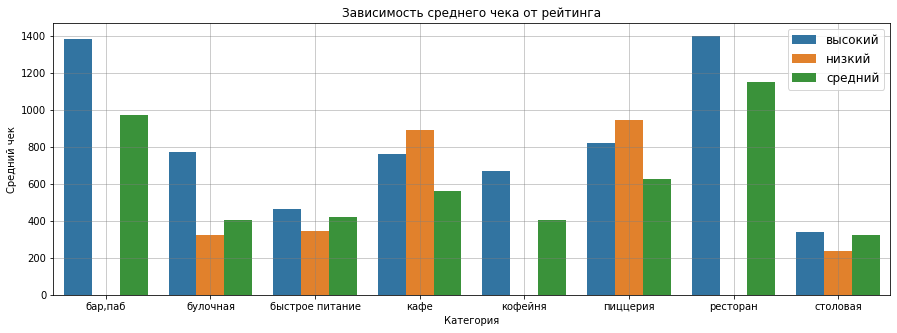

In [ ]:
plt.figure(figsize=(15, 5))
sns.barplot(x='category', y='middle_avg_bill', data=date_bill_rating, hue='type_rating')
plt.title('Зависимость среднего чека от рейтинга')
plt.xlabel('Категория')
plt.ylabel('Средний чек')
plt.legend(loc='upper right', fontsize=12)
plt.grid(color='grey', axis='both', alpha=0.5)
plt.show()

Во всех категориях, кроме кафе, высокий рейтинг соответствует высокому уровеню среднего чека. А в кафе наоборот, низкий рейтинг у кафе с высоким уровнем среднего чека. В пункте 3.8 мы считали какие рейтинги вообще ставят пользователи. Ретинги в данных от 4.1 до 4.38. Разница не большая. К тому же поле рейтинга не содержит пропуски, значит люди в любом случае чаще всего ставят довольно высокий рейтинг заведению не зависимо от чека.

***ВЫВОД:***
Проанализировав данные можно сделать следующие выводы:

1. В имеющихся данных по количеству заведений на первом месте находятся Кафе, чуть меньше Ресторанов, на третьем месте Кофейни. На последих местах с ббольшой разницей столовые и булочные.
2. Доля не сетевых заведений значительно превышает долю сетевых. Сетевыми чаще всего бывают булочные, пиццерии и кофейни. Реже всего бары и столовые.
3. Больше всего сетевых заведений с названием Шоколадница. Шоколадница лидирует с большим отрывом. На втором месте Доминос'с пицца и на третьем Додо пицца. Все следующие заведения идут не с таким уже большим отрывом.
4. Если посмотреть топ 15 популярных сетей с распределением по категориям, то видим, что большинство из них относятся к категории кафе, кофейни и рестораны. Всего в топ 15 вошли 816 заведений.
5. В датасете присутствуют 9 административных районов. Больше всего заведений 2242 в центральном районе. Из них больше всего ресторанов , кафе, кофейни и бары. Меньше всего заведний в Северо-Западном административном округе - 409. По остальным районам заведения распределены примерно одинаково. Везде лидируют кафе, на втором месте рестораны, на третьем кофейни. И нигде нет такого процента баров как в центральном районе.
6. Усреднённые рейтинги в разных типах общепита отличаются не сильно и расположены от 4 до 4.5. Ниже всего рейтинг у категории быстрое питание, чуть выше у кафе. Самый высокий у баров. Выяснили, что самый высокий рейтин посетители ставят заведения в Центральном административном округе, далее в Северном и Северо-Западном. В Северо-Западном заведений меньше всего, но кормят видимо вкусно. А вот в Юго восточном округе рейтинг заведений самый низкий. Во всех категориях, кроме кафе, высокий рейтинг соответствует высокому уровеню среднего чека. А в кафе наоборот, низкий рейтинг у кафе с высоким уровнем среднего чека. В пункте 3.8 мы считали какие рейтинги вообще ставят пользователи. Ретинги в данных от 4.1 до 4.38. Разница не большая. К тому же поле рейтинга не содержит пропуски, значит люди в любом случае чаще всего ставят довольно высокий рейтинг заведению не зависимо от чека.
7. Улица лидер, по количеству заведений - Проспект мира. Больше всего на ней ресторанов, кафе и кофейн. За ней следует Профсоюзная улица, на которой лидирут кафе, рестораны, и примерно одинаковое количество пиццерий, кофейн и заведений быстрого питания. Меньше всего на всех улицах из топ 15 столовых и булочных.

## Открытие кофейни.

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [ ]:
# создадим датасет с кофейнями
coffe = data.query("category == 'кофейня'")
coffe.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,type_rating
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False,высокий
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False,высокий
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,False,средний
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False,средний
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,False,средний


In [ ]:
coffe['name'].count()

1413

In [ ]:
coffe.groupby('district')['name'].count().reset_index().sort_values(by='name',ascending=False)

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


Всего кофеен 1413. Большая часть - 428, находятся в центре. Меньше всего в северо-западном округе (всего 62).

### Есть ли круглосуточные кофейни?

В пункте 2 мы создали поле is_24/7, которое показывает что заведение работает ежедневно и круглосуточно. Используем его для выбора круглосуточных кофейн.

In [ ]:
coffe.query('is_24_7==True')['name'].count()

59

Круглосуточных кофейн 59.

### Какие у кофеен рейтинги? Как они распределяются по районам?

Посмотрим рейтинги

In [ ]:
coffe['rating'].describe()

count    1413.000000
mean        4.277282
std         0.372250
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Средний рейтинг по кофейням 4.28. Можно посмотреть какие рейтинги у кофеен в разных районах. Ранее мы создавали поле с типом рейтинга type_rating.

In [ ]:
date_district_rating = coffe.groupby(['district', 'type_rating'])['name'].count().reset_index()
date_district_rating

,district,type_rating,name
0,Восточный административный округ,высокий,76
1,Восточный административный округ,средний,29
2,Западный административный округ,высокий,94
3,Западный административный округ,низкий,2
4,Западный административный округ,средний,54
5,Северный административный округ,высокий,136
6,Северный административный округ,низкий,3
7,Северный административный округ,средний,54
8,Северо-Восточный административный округ,высокий,103
9,Северо-Восточный административный округ,низкий,3


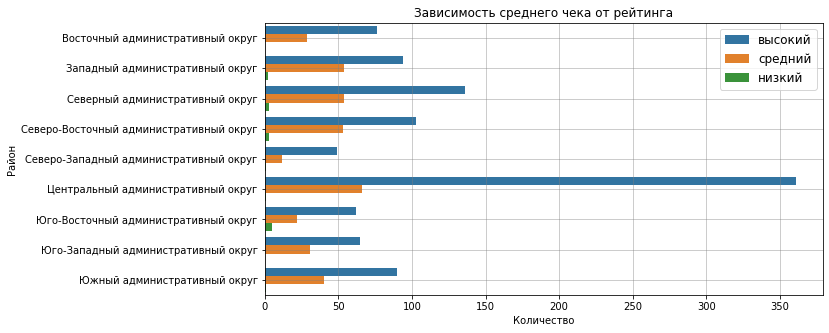

In [ ]:
plt.figure(figsize=(10, 5))
sns.barplot(x='name', y='district', data=date_district_rating, hue='type_rating')
plt.title('Зависимость среднего чека от рейтинга')
plt.xlabel('Количество')
plt.ylabel('Район')
plt.legend(loc='upper right', fontsize=12)
plt.grid(color='grey', axis='both', alpha=0.5)
plt.show()

Видно, что во всех районах пользователи ставят кофейням восновном высокий рейтинг. В крайнем случае средний.

Посмотрим, как кофейни распределены по районам

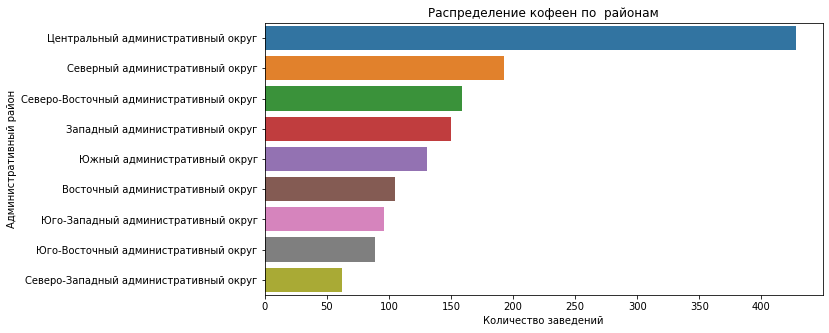

In [ ]:
district = coffe.pivot_table(index = 'district', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
plt.figure(figsize=(10, 5))
sns.barplot(x = 'name', y = 'district', data = district)
plt.title('Распределение кофеен по  районам')
plt.xlabel('Количество заведений')
plt.ylabel('Административный район')
plt.show()

График подтверждает, что больше всего кофеен в центральном районе, меньше всего в северо-западном.  Посмотрим расположение на карте.

In [ ]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
coffe.apply(create_clusters, axis=1)
m

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [ ]:
cup= coffe.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
cup

,district,middle_coffee_cup
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


In [ ]:
price_cup = round(cup['middle_coffee_cup'].mean(), 2)
price_cup

171.32

Средняя стоимость чашки капучино в имеющихся кофейнях 171.32 рубля. Самая дорогая чашка в западном районе, на втором месте центральный район, третьем юго-западный. Самый дешевый кофе в юго-восточном районе.

Стоимость чашки капучино, на которую стоит ориентироваться при оькрытии заведения будет зависеть от места открытия.

### Посмотрим сколько посадочных мест в кофейнях по районам.

In [ ]:
# помотрим количество посадочных мест в кофейнях по районам
seats = coffe.groupby(['district']).agg(count=('seats', 'count')).sort_values('count', ascending=False)
seats

,count
district,
Центральный административный округ,218
Северный административный округ,110
Западный административный округ,91
Северо-Восточный административный округ,83
Южный административный округ,75
Юго-Западный административный округ,56
Восточный административный округ,45
Юго-Восточный административный округ,39
Северо-Западный административный округ,34


Меньше всего в Северо-Западном районе, исследуем в этом районе средний чек

In [ ]:
cofee_nameSZ = coffe.query("district == 'Северо-Западный административный округ'")

In [ ]:
# посмотрим средний чек в Северо-Западном районе
cofee_nameSZ['middle_avg_bill'].describe()

count     11.000000
mean     440.636364
std      234.862629
min      225.000000
25%      267.500000
50%      325.000000
75%      625.000000
max      850.000000
Name: middle_avg_bill, dtype: float64

Средний чек 440, а чашка кофе в этом районе 165.52.

***ВЫВОД:***

  Проведя исследнование имеющихся в датасете кофейн можно рекомендовала открыть кофейню в Северо-Западном административном округе. Кофеен здесь меньше всего (62 заведения). Среднее количество посадочных мест тоже меньше всего - 34 места. Средняя стоимость чашки капучино не самая низкая, средняя по району 165,52 рубля. На эту стоимость тут и можно ориентироваться. Средний чек для кофейни в этом районе 440 рублей, максимальный 850 рублей.
  Открывать кофейню лучше в месте с высокой проходимостью, например, метро, либо возле учебных заведений. Тогда можно будет за счет большого потка клиентов снизить стоимость чашки кофе и сделать кофейню более доступной. В этом районе например находится находится один из новых корпусов Российского Химико-технологического Университета, можно разместить кофейню не далеко от корпуса. Либо ориентироваться на туристов и выбрать место рядом с музеями, например музеем военно-морского флота или Крокус Сити Океанариум.
  Как вариант разместить кофейню рядом с парком «Серебряный бор». При выборе места, также нужно учесть, что место должно подходить по своей атмосфере. Можно размещать по соседству с местами высокой проходимости, а к себе трафик привлечь дегустациями и сэкономить на аренде помещения.
  Такие рекомендации я бы дала если инвесторы планируют открыть не одну кофейню, а сеть, вот начать можно с этого района.
  
  
Но если инвесторы  хотят одну кофейню, но знаковую, то открываться, конечно, лучше в центре. Не стоит при этом тратиться на аренду помещения в проходном месте — люди до вас дойдут, если вы сделаете что-то действительно стоящее.
  
  Как вариант открыть кофейню рядом с другими известными проектами с хорошей репутацией. Чем больше вокруг хороших проектов, тем больше посетителей приходят в эту точку. Поэтому открываться соседней дверью с кофейней не только можно, но и нужно. Эта кофейня уже раскрутила место (люди запомнили, что здесь можно брать кофе), поэтому, если вы будете выигрывать по качеству, вы сможете всех к себе переманить.
   
Тематические кофейни всегда будут в моде, это прекрасная идея! Интерьер кофейни можно стилизован под кофейню Central Perk, в которой собирались герои "Друзей". Желтые стены, кирпичная кладка, постеры и "тот самый" оранжевый диван. На телевизорах, установленных в заведении, весь день транслируют "Друзей" и подают капучино в комично больших кружках.


## Подготовка презентации.

Презентация: https://disk.yandex.ru/d/Ab6icx3B0aMB1g

## Вывод

 В данном проекте были проанализированы данные по заведениям общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето  2022 года.
 В имеющихся данных по количеству заведений на первом месте находятся Кафе, чуть меньше Ресторанов, на третьем месте Кофейни. На последих местах с большой разницей столовые и булочные. Доля не сетевых заведений значительно превышает долю сетевых. Сетевыми чаще всего бывают булочные, пиццерии и кофейни. Реже всего бары и столовые.
Больше всего сетевых заведений с названием Шоколадница. Шоколадница лидирует с большим отрывом. На втором месте Доминос'с пицца и на третьем Додо пицца. Все следующие заведения идут не с таким уже большим отрывом.
Если посмотреть топ 15 популярных сетей с распределением по категориям, то видим, что большинство из них относятся к категории кафе, кофейни и рестораны. Всего в топ 15 вошли 816 заведений.
В датасете присутствуют 9 административных районов. Больше всего заведений 2242 в центральном районе. Из них больше всего ресторанов , кафе, кофейни и бары. Меньше всего заведний в Северо-Западном административном округе - 409. По остальным районам заведения распределены примерно одинаково. Везде лидируют кафе, на втором месте рестораны, на третьем кофейни. И нигде нет такого процента баров как в центральном районе.
Усреднённые рейтинги в разных типах общепита отличаются не сильно и расположены от 4 до 4.5. Ниже всего рейтинг у категории быстрое питание, чуть выше у кафе. Самый высокий у баров. Выяснили, что самый высокий рейтин посетители ставят заведения в Центральном административном округе, далее в Северном и Северо-Западном. В Северо-Западном заведений меньше всего, но кормят видимо вкусно. А вот в Юго восточном округе рейтинг заведений самый низкий. Во всех категориях, кроме кафе, высокий рейтинг соответствует высокому уровеню среднего чека. А в кафе наоборот, низкий рейтинг у кафе с высоким уровнем среднего чека. В пункте 3.8 мы считали какие рейтинги вообще ставят пользователи. Ретинги в данных от 4.1 до 4.38. Разница не большая. К тому же поле рейтинга не содержит пропуски, значит люди в любом случае чаще всего ставят довольно высокий рейтинг заведению не зависимо от чека.
Улица лидер, по количеству заведений - Проспект мира. Больше всего на ней ресторанов, кафе и кофейн. За ней следует Профсоюзная улица, на которой лидирут кафе, рестораны, и примерно одинаковое количество пиццерий, кофейн и заведений быстрого питания. Меньше всего на всех улицах из топ 15 столовых и булочных.
На первом месте в рейтинге топ 15 улиц по количеству заведений Проспект мира (Северо-Восточного административный округ и Центральный административный округ), далее Профсоюзая улица (ЮЗАО) и Проспект Вернадского (Западный административный округ). Улицы лидеры находятся даже не в Центральном округе!

Средние чеки в центральном и западном округах значительно выше остальных районов (почти в 2 раза). На третьем месте северо-западный округ. Видимо удалённость от центра влияет на цены, но не во всех округах.

 Во второй части проекта были отдельно проанализированы кофейни. Были сделаны выводы, что если планировать открывать целую сеть, то можно начать с района, в котором меньше всего заведений, а потом если все пойдет хорошо, открывать заведения в более дорогих районах. Либо открыть одну знаковую кофейню в ценральном районе, вблизи раскрученых заведений.

 Для заказчиков была подготовлена подробная презентация по результатам исследования.
